# Project Proposal

## Summary

In this project, I analyzed the Spotify Track Dataset, which is retrieved from Kaggle. My analysis mainly includes two parts: exploratory descriptive analysis and a simple regression model leveraging Scikit-Python.


**About the Dataset**

This is a dataset of Spotify tracks over a range of 125 different genres. Each track has some audio features associated with it like loudness, acousticness, speechiness, etc. The dataset is very big, containing 20 columns and over 110,000 rows. It’s stored in tabular CSV format and can be loaded quickly.


**Process**

After reading the dataset, I first did a quick classification of the variables, to find columns of interest for further analysis. I deleted the original id column and divided the rest 19 columns into 3 categories: 1st, 2nd, and 3rd metrics, with 1st metric being those naturally built-in metrics (e.g. loudness), 2nd metric indicating an intermediate metric that has gone through certain calculation by the algorithm (e.g. valence) and 3rd metric noting the one that I felt excited about most, which is popularity. My initial assumption is that I can find out certain patterns on 2nd metrics and its relationship with 1st metrics, and use them to predict popularity.

Then I started my analysis. To begin with, I checked whether there are any missing values in the dataset, and dropped 1 row with NA values. Then I transformed the duration from its original millisecond into minutes for better understanding. After that, I checked outliers via boxplot and removed them using z-score method.

In EDA, I mainly looked at the distribution of columns of interest (2nd and 3rd metric). Since popularity is the metric I care most, I further conducted some manipulation like filtering and grouping to look at popular artists, genres, and its distribution under whether the song is explicit. Based on that, I plotted a pairplot and a heatmap to explore potential correlation between these metrics. The graphs show slight clues between other variables and my target 3rd metric, popularity; instead, it hints potential relationship between some 1st metric and 2nd metric. Thus I decided to shift gear and focus on ‘energy’, one of the 2nd metrics to perform predictive analysis.

In the last part, I built a Linear Regression model using Scikit-learn, and from the results on the test set, the R-square of my model is 0.7379, which is greater than 0.7 and can be considered as a good fit.


**Gaps & Limitations**

Considering there's little correlation between other metrics and popularity, this dataset might not be a good choice for machine learning practice if the target is predicting song popularity. I also tried K-Means Clustering on both the genres and songs, but the results are not good, which may indicate that if I want to build recommendation system based on this dataset, it's not appropriate to leverage K-Means clustering. 


**Topics Covered**

- Data Manipulation (Missing values & outliers’ detection and removal)
- Exploratory Data Analysis (EDA)
- Seaborn & Plotly Visualizations
- Linear Regression with Scikit-learn

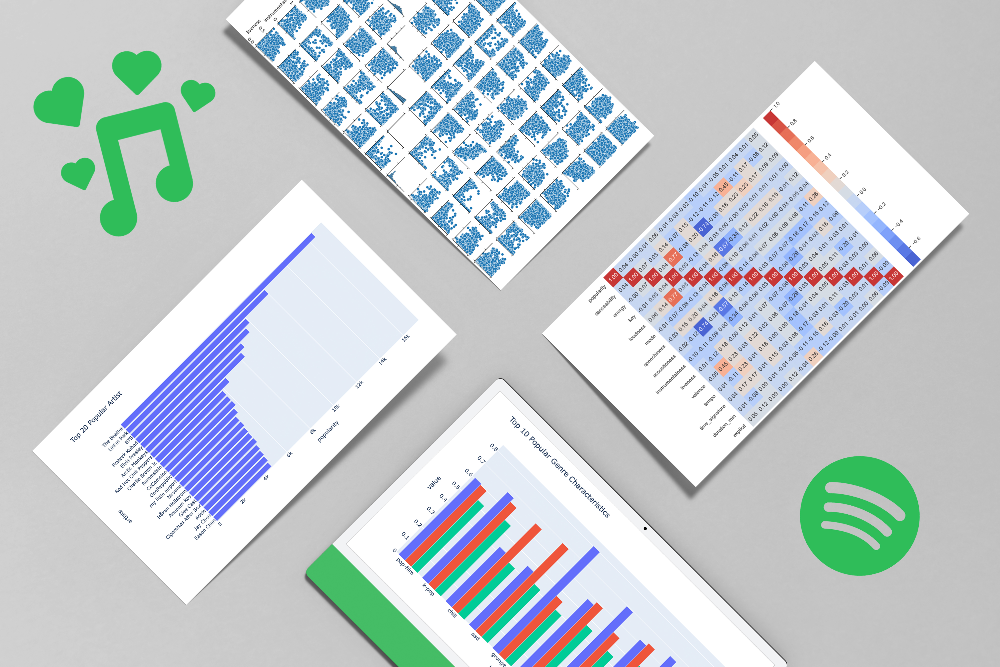

## Setup

### Import Libraries

In [1]:
import numpy as np
import pandas as pd
import webbrowser
import scipy.stats as stats

In [2]:
import seaborn as sns

import matplotlib.pyplot as plt
import plotly.express as px 

In [3]:
import sys
assert sys.version_info >= (3, 7)

In [4]:
from packaging import version
import sklearn

assert version.parse(sklearn.__version__) >= version.parse("1.0.1")

In [5]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

In [6]:
pip install kneed --quiet

Note: you may need to restart the kernel to use updated packages.


### Data Sources

I retrieved the dataset from Kaggle and downloaded the raw data in tabular format stored in csv file. This is a dataset of Spotify tracks over a range of 125 different genres. Each track has some audio features associated with it.

In [7]:
webbrowser.open("https://www.kaggle.com/datasets/maharshipandya/-spotify-tracks-dataset")

True

### Column Description

#### general background knowledge on categorcial variables
- **artists**: The artists' names who performed the track. If there is more than one artist, they are separated by a ;

- **album_name**: The album name in which the track appears

- **track_name**: Name of the track

- **track_genre**: means the genre in which the track belongs, including acoustic, classcial, party, hardstyle, etc. There are 114 types of genre in total, and each of them contains 1000 tracks. 

- **explicit**: whether or not the track has explicit lyrics (True = Yes; False = No OR unknown)

---

#### 1st metric: some directly generated attributes without little processing

- **loudness**: The overall loudness of a track in dB

- **speechiness**: Speechiness detects the presence of spoken words in a track. The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. Values above 0.66 describe tracks that are probably made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. Values below 0.33 most likely represent music and other non-speech-like tracks

- **acousticness**: A confidence measure from 0.0 to 1.0 of whether the track is acoustic. 1.0 represents high confidence the track is acoustic

- **instrumentalness**: Predicts whether a track contains no vocals. The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content. "Ooh" and "aah" sounds are treated as instrumental in this context. Rap or spoken word tracks are clearly "vocal". 

- **liveness**: Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides strong likelihood that the track is live

##### Pay attention to units
- **duration_ms**: the track length; unit is milliseconds.

- **tempo**: The overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration
---

#### 2nd metric: generated through some calculation & formula, not a natural build-in attribute

- **danceability**: describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable

- **energy**: Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. 

- **valence**: A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry)

---

#### 3rd metric: potential key metric to be targeted

- **popularity**: the popularity of a track is a value between 0 and 100, with 100 being the most popular. The popularity is calculated by algorithm and is based, in the most part, on the total number of plays the track has had and how recent those plays are. Generally speaking, songs that are being played a lot now will have a higher popularity than songs that were played a lot in the past.

---

#### side notes for music pro
- **key**: The key the track is in. Integers map to pitches using standard Pitch Class notation. E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on. If no key was detected, the value is -1

- **mode**: Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0

- **time_signature**: An estimated time signature. The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure)

### Read Data

In [8]:
spotify=pd.read_csv("dataset.csv", index_col=0)
spotify.info() 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 114000 entries, 0 to 113999
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   track_id          114000 non-null  object 
 1   artists           113999 non-null  object 
 2   album_name        113999 non-null  object 
 3   track_name        113999 non-null  object 
 4   popularity        114000 non-null  int64  
 5   duration_ms       114000 non-null  int64  
 6   explicit          114000 non-null  bool   
 7   danceability      114000 non-null  float64
 8   energy            114000 non-null  float64
 9   key               114000 non-null  int64  
 10  loudness          114000 non-null  float64
 11  mode              114000 non-null  int64  
 12  speechiness       114000 non-null  float64
 13  acousticness      114000 non-null  float64
 14  instrumentalness  114000 non-null  float64
 15  liveness          114000 non-null  float64
 16  valence           11

## Data Manipulation

### 1. Check Any Missing Values

In [9]:
spotify.dtypes

track_id             object
artists              object
album_name           object
track_name           object
popularity            int64
duration_ms           int64
explicit               bool
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
time_signature        int64
track_genre          object
dtype: object

In [10]:
num_vars = spotify.columns[spotify.dtypes != 'object']
cat_vars = spotify.columns[spotify.dtypes == 'object']

In [11]:
spotify[num_vars].isnull().sum().sort_values(ascending=False)/len(spotify)

popularity          0.0
duration_ms         0.0
explicit            0.0
danceability        0.0
energy              0.0
key                 0.0
loudness            0.0
mode                0.0
speechiness         0.0
acousticness        0.0
instrumentalness    0.0
liveness            0.0
valence             0.0
tempo               0.0
time_signature      0.0
dtype: float64

There are no null values in numeric variables.

In [12]:
spotify[cat_vars].isnull().sum().sort_values(ascending=False)/len(spotify)

artists        0.000009
album_name     0.000009
track_name     0.000009
track_id       0.000000
track_genre    0.000000
dtype: float64

In [13]:
spotify[spotify.track_name.isnull()==True] # find NA

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
65900,1kR4gIb7nGxHPI3D2ifs59,NaN,NaN,NaN,0,0,False,0.501,0.583,7,-9.46,0,0.0605,0.69,0.00396,0.0747,0.734,138.391,4,k-pop


In [14]:
spotify.drop(index=65900, inplace=True) # remove NA
spotify.head()

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


### 2. Cleaning

In [15]:
spotify.explicit=spotify.explicit.replace({False:0, True:1})
spotify.duplicated('track_id',keep='first')

0         False
1         False
2         False
3         False
4         False
          ...  
113995    False
113996    False
113997    False
113998    False
113999    False
Length: 113999, dtype: bool

In [16]:
# transform ms into minute for better reading
spotify['duration_min'] = spotify['duration_ms']/60000

In [17]:
spotify=spotify.drop(['track_id','duration_ms'],axis=1)
scolumns=list(spotify.columns)
scolumns

['artists',
 'album_name',
 'track_name',
 'popularity',
 'explicit',
 'danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'time_signature',
 'track_genre',
 'duration_min']

### 3. Outlier Detection & Removal

Text(0.5, 1.0, 'Boxplot of Numeric Variables')

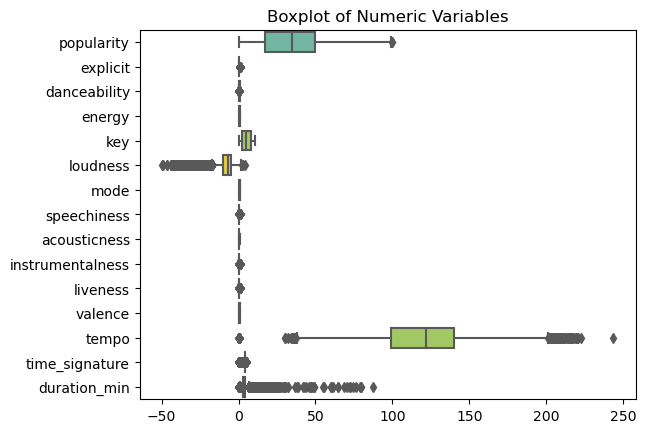

In [18]:
sns.boxplot(data=spotify,orient='h', palette='Set2')
plt.title('Boxplot of Numeric Variables')

The above boxplot shows that there are some outliers existing in the dataset, especially in the distribution of the 'duration_min' variable. Since the dataset is already pretty large, I consider to remove them, with special attention to boolean values.

Text(0.5, 1.0, 'Explicit Distribution')

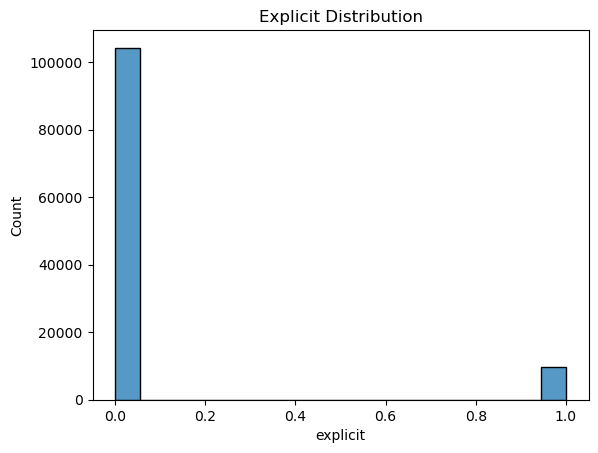

In [19]:
sns.histplot(spotify['explicit'])
plt.title('Explicit Distribution')

Here I paid special attention to the only boolean column 'explicit'. From the distribution histogram, most of the explicit values are 0, which may result in turning True values to 'outliers'. Since 'explicit' is also one of the columns of interests, I will seperate it out of the whole dataframe before removing outliers.

In [20]:
bool_spotify = spotify.loc[:,'explicit']
spotify_no_bool=spotify.drop(['explicit'],axis=1)

To detect and remove outliers, I will use z-score method. To apply that, I'll first separate my dataset into numerical and categorical.

In [21]:
num_spotify = spotify_no_bool.select_dtypes(include=["number"])
cat_spotify = spotify_no_bool.select_dtypes(exclude=["number"])

z = np.abs(stats.zscore(num_spotify))
idx = np.all(z<3, axis=1)

# add the three pieces together
spotify_cleaned = pd.concat([num_spotify.loc[idx], cat_spotify.loc[idx], bool_spotify.loc[idx]], axis=1)
print('Old Shape:', spotify.shape)
print('New Shape:', spotify_cleaned.shape)

Old Shape: (113999, 19)
New Shape: (104710, 19)


## Exploratory Data Analysis (EDA)

### 1. Distribution of Column of Interest

In [22]:
spotify_cleaned.popularity.describe()

count    104710.000000
mean         33.355544
std          22.621267
min           0.000000
25%          16.000000
50%          35.000000
75%          51.000000
max         100.000000
Name: popularity, dtype: float64

skew:  0.04445748166222977


Text(0.5, 1.0, 'Popularity Distribution')

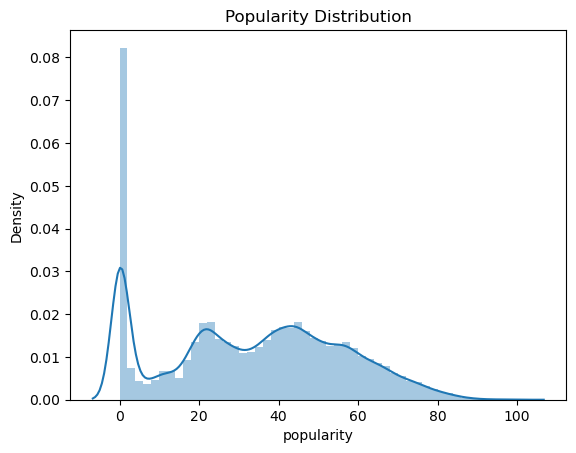

In [23]:
sns.distplot(spotify_cleaned['popularity'])
print("skew: ",spotify_cleaned.popularity.skew())
plt.title('Popularity Distribution')

Overall the popularity distribution is a multinomial distribution and there's a peak around 0. Next I will further check what's happening around 0, see if there's actually a huge population with a popularity score of 0.

In [24]:
spotify_unpop = spotify_cleaned.query('popularity==0')
spotify_unpop.count()

popularity          15159
danceability        15159
energy              15159
key                 15159
loudness            15159
mode                15159
speechiness         15159
acousticness        15159
instrumentalness    15159
liveness            15159
valence             15159
tempo               15159
time_signature      15159
duration_min        15159
artists             15159
album_name          15159
track_name          15159
track_genre         15159
explicit            15159
dtype: int64

There are around 15000 rows with a popularity of 0. Considering it's a huge amount and it makes sense to have a score of 0 (popularity takes value from 0 to 100, inclusively), I will simply keep them in future analysis.

danceability skew:  -0.3571365541542357
energy skew:  -0.5416924122387579
valence skew:  0.10848524160568122


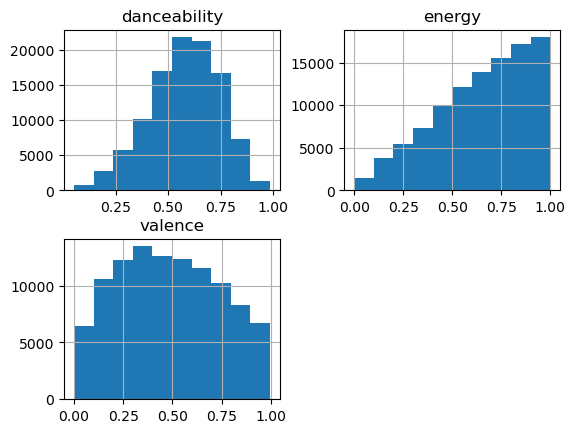

In [25]:
# 2nd metric distribution
spotify_cleaned.hist(column=['danceability','energy','valence'])
print("danceability skew: ",spotify_cleaned.danceability.skew())
print("energy skew: ",spotify_cleaned.energy.skew())
print("valence skew: ",spotify_cleaned.valence.skew())

- The shape of the 'danceability' variable distribution is close to a normal distribution, with a little left-skewness, showing that most song tracks have a middle danceability around 0.55-0.7;

- Distribution of the 'energy' column is also left skewed. As the energy value goes up, the amount of songs goes up as well, indicating that most songs in this dataset have a high energy value - their intensity and activity are well perceived. Its mean and quartiles listed below also prove this:

In [26]:
spotify_cleaned.energy.describe()

count    104710.000000
mean          0.652194
std           0.238821
min           0.000020
25%           0.486000
50%           0.690000
75%           0.855000
max           1.000000
Name: energy, dtype: float64

- The 'valence' column also shows a approximately normal distribution, except at boundaries (when valence = 0 or valence = 1) the counts are still high. This means that there are a group of songs in this dataset that are perceived as absolutely musical negative (e.g. sad, depressed, angry) and musical positive (e.g. happy, cheerful, euphoric) by the algorithm.

### 2. More Visualizations with Popularity

In [27]:
# Top 20 Popular Artist
spotify_solo=spotify_cleaned[spotify_cleaned['artists'].str.contains(';',na=False)==False] #filter out collaboration songs
spotify_pop_artist=spotify_solo.groupby('artists')['popularity'].sum().sort_values(ascending=False).head(20)
pic=px.bar(spotify_pop_artist.sort_values(ascending=True), orientation='h', x='popularity', title='Top 20 Popular Artist')
pic.show()

From the lens of cumulative popularity, The Beatles, Linkin Park, and BTS are considered to be the most popular artists in this dataset.

In [28]:
# Top 10 Popular Genre Characteristics
metric_cols=['popularity','energy', 'danceability','valence']
top10_genres = spotify_cleaned.groupby('track_genre')[metric_cols].mean().sort_values(by=metric_cols,ascending=[False,False,False,False]).head(10).reset_index()

fig = px.bar(top10_genres, x='track_genre', y=['energy', 'danceability','valence'], barmode='group', title='Top 10 Popular Genre Characteristics')
fig.show()

Here I filtered the top 10 popular genres and looked at their performance in 2nd metric (energy, danceability, valence) respectively. From the graph, it can be observed that Grunge music has the highest average energy value, sad music has the highest danceability score (surprisingly) and Sertanejo music (a music style that had its origins in the countryside of Brazil) is considered to be the most positive genre on average.

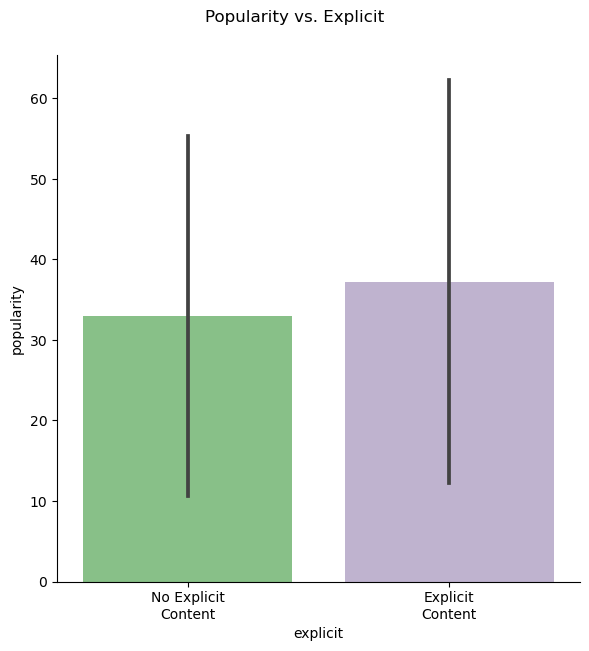

In [29]:
# Explicit VS Popularity
exp_spotify = sns.catplot(data=spotify_cleaned, kind="bar",
                        x="explicit", y="popularity",
                        ci="sd", palette='Accent',
                        height=6)
exp_spotify.fig.suptitle('Popularity vs. Explicit', y=1.05)
exp_spotify.set_xticklabels(['No Explicit\nContent', 'Explicit\nContent'])
plt.show() 

To observe the 'explicit' column more closely, I plotted the above barplot. On average, although the amount of songs with explicit content is smaller, they do have a higher popularity.

### 3. Potential Correlation Exploration

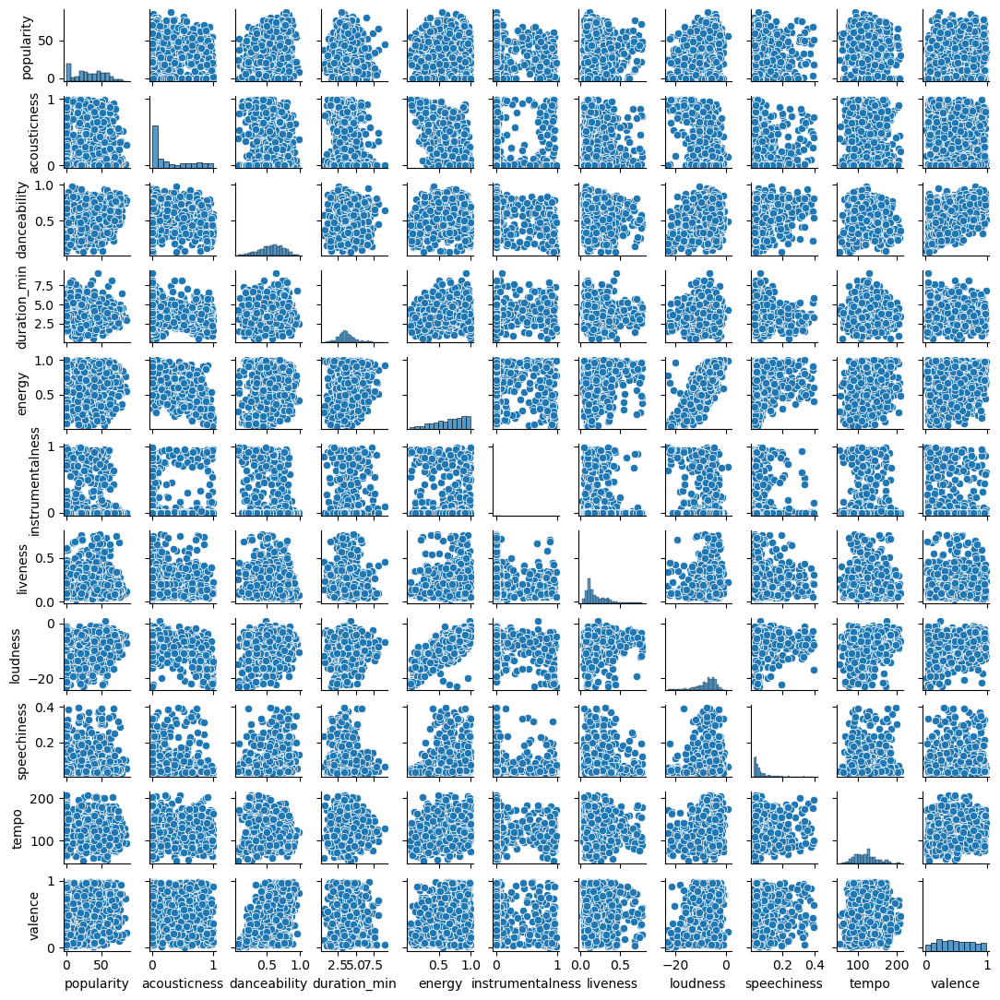

In [30]:
sns_plot = sns.pairplot(spotify_cleaned.sample(1000), height=1, vars=['popularity', 'acousticness', 'danceability', 
                                                              'duration_min', 'energy', 'instrumentalness', 
                                                              'liveness', 'loudness', 'speechiness', 
                                                              'tempo', 'valence']) 
# Data is sampled due to long running time
plt.show()

<AxesSubplot:>

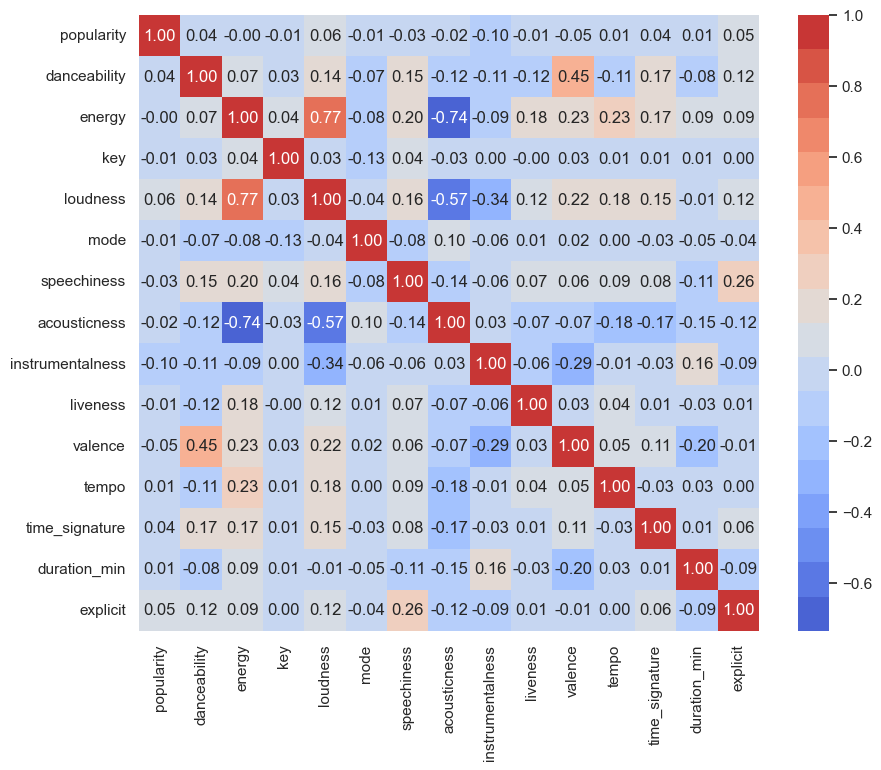

In [31]:
sns.set(rc={'figure.figsize':(10,8)})
sns.heatmap(spotify_cleaned.corr(), annot=True, fmt=".2f", cmap = sns.color_palette("coolwarm",18))

The graphs above show that there are few signs of strong relationship existing between other variables and the 3rd metric 'popularity' that I want to target at the beginning. But there are potential correlation existing between 1st metrics and 2nd metrics (e.g. loudness and energy), so I consider to shift my gear and focus on 2nd metrics as target variables to perform further analysis.

## Build Regression Model with Scikit-learn

In [32]:
features = ['loudness','speechiness','acousticness','liveness','tempo']
X=spotify_cleaned[features]
y=spotify_cleaned['energy']
print(X.shape, y.shape)

(104710, 5) (104710,)


In [33]:
# pre-processing
from sklearn.preprocessing import MinMaxScaler
X_copy = X[:]

scaler = MinMaxScaler()
X_transformed = scaler.fit_transform(X_copy)

In [34]:
# build train & test sets
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test = train_test_split(X_transformed,y,
                                                 random_state=1,test_size=.2)

In [35]:
# build linear regression model
from sklearn import linear_model
lm = linear_model.LinearRegression()

model = lm.fit(X_train,y_train)
print(model.intercept_,model.coef_)

0.20161403863592042 [ 0.8400844   0.07134813 -0.31415592  0.10485917  0.07764395]


In [36]:
# model evaluation
model.score(X_test,y_test)
print ('R^2 is: \n', model.score(X_test,y_test))

R^2 is: 
 0.7379060426217512


This shows my model explained around 73.79% of the target y variable 'energy'. R-square is greater than 0.7, which can be considered as a good fit.

## References

https://github.com/arvkevi/kneed

https://realpython.com/k-means-clustering-python/

https://www.kaggle.com/code/vatsalmavani/music-recommendation-system-using-spotify-dataset#Import-Libraries

https://towardsdatascience.com/detecting-and-treating-outliers-in-python-part-1-4ece5098b755

https://www.geeksforgeeks.org/detect-and-remove-the-outliers-using-python/

https://www.statology.org/remove-outliers-python/

https://stackoverflow.com/questions/54398554/how-to-remove-outliers-in-python

https://www.simplilearn.com/tutorials/scikit-learn-tutorial/sklearn-linear-regression-with-examples